In [15]:
import sys

sys.path.append("../helper_functions")
import duneapi_utils as d
import pandas as pd

import plotly.graph_objects as go
import plotly.express as px
from sklearn.cluster import KMeans
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

In [16]:
run_queries = 0 # 1 if we want to rerun, 0 if we want to use the existing csv

# add any data to pull here
data = {
    2465536: "l1_nft_users_on_op",
    # 2467309: "l1_nft_users_on_op_w_mints" 
}

for query_id, csv_name in data.items():
    if run_queries ==1:
        d.get_dune_data(query_id, csv_name)

2023-05-12 12:53:18.040 | INFO     | duneapi_utils:get_dune_data:33 - Results available at https://dune.com/queries/2467309
2023-05-12 12:53:20,222 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING
2023-05-12 12:53:25,680 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING
2023-05-12 12:53:31,118 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING
2023-05-12 12:53:36,575 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING
2023-05-12 12:53:42,008 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING
2023-05-12 12:53:47,465 INFO dune_client.base_client waiting for query execution 01H08E3638XGHRFD5ETEQZKJA1 to complete: ExecutionState.EXECUTING


DuneError: Can't build ResultsResponse from {'error': 'This api request would exceed your configured limits. Please visit your settings on dune.com and adjust your limits to continue usage.'}

In [13]:
df = pd.read_csv("../misc_analysis/csv_outputs/l1_nft_users_on_op.csv")
df.shape

(62431, 9)

In [14]:
# Create columns for each NFT Platform
df['names'] = df['name'].str.replace(' User', '')

unique_names = set(df['names'].str.split(', ').explode())

print(unique_names)

for name in unique_names:
    df[f'is_{name.lower()}'] = df['name'].str.contains(name).astype(int)

df.sample(10)

{'Liquidifty', 'Zora', 'Archipelago', 'Collectionswap', 'Superrare', 'Opensea', 'Element', 'Foundation', 'X2y2', 'Cryptopunks', 'Blur', 'Looksrare', 'Sudoswap', 'Trove'}


,address,age,first_timestamp,last_timestamp,name,num_days_active,num_txs,recency,last_updated,names,...,is_superrare,is_opensea,is_element,is_foundation,is_x2y2,is_cryptopunks,is_blur,is_looksrare,is_sudoswap,is_trove
50762,0xb4960f984c110dfd3ec4ec23a6e7a738d74140c4,NaN,NaN,NaN,"Opensea, Foundation User",NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,"Opensea, Foundation",...,0,1,0,1,0,0,0,0,0,0
3116,0x58f1a54de7db6524be839ebb88cdda120df44274,634.0,2021-08-15 10:30:56.000 UTC,2023-05-12 03:42:39.000 UTC,"Zora, Opensea User",30.0,160.0,0.0,2023-05-12 08:50:45.676857+00:00,"Zora, Opensea",...,0,1,0,0,0,0,0,0,0,0
39804,0xebcf05d6de440cbadd3e59d014635911bc0b68a1,NaN,NaN,NaN,Foundation User,NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,Foundation,...,0,0,0,1,0,0,0,0,0,0
40735,0xcab072efbb2f239d32b39305b2cd62b7f1035a57,NaN,NaN,NaN,"Opensea, Foundation User",NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,"Opensea, Foundation",...,0,1,0,1,0,0,0,0,0,0
14356,0xe1a84cd76b93aff404cad04f8ca53d6f7aac46c6,77.0,2023-02-23 16:24:28.000 UTC,2023-02-23 16:24:28.000 UTC,Foundation User,1.0,1.0,77.0,2023-05-12 08:50:45.676857+00:00,Foundation,...,0,0,0,1,0,0,0,0,0,0
23034,0xb3a1ba7cf15f038aed2194afe76ca2c4aa995a5d,NaN,NaN,NaN,Foundation User,NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,Foundation,...,0,0,0,1,0,0,0,0,0,0
54851,0x7fb48df40bf81b54e5b646ed0211354ff633307b,NaN,NaN,NaN,"Foundation, Opensea User",NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,"Foundation, Opensea",...,0,1,0,1,0,0,0,0,0,0
35009,0x4e1829da30cd7ae2f3e9915cb8c9f3f203ac7d83,NaN,NaN,NaN,"Opensea, Foundation User",NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,"Opensea, Foundation",...,0,1,0,1,0,0,0,0,0,0
26090,0xd003861bbcb67b3d2a26a9e3890bd64c97bb6931,NaN,NaN,NaN,Foundation User,NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,Foundation,...,0,0,0,1,0,0,0,0,0,0
15386,0x219ef848a2ad307d8d4a899262d860c51ac8076b,NaN,NaN,NaN,"Foundation, Opensea, Looksrare, X2y2 User",NaN,NaN,NaN,2023-05-12 08:50:45.676857+00:00,"Foundation, Opensea, Looksrare, X2y2",...,0,1,0,1,1,0,0,1,0,0


In [3]:
percentage = 1 - df["first_timestamp"].isna().sum() / df.shape[0]
formatted_percentage = "{:.1%}".format(percentage)
print("{} of L1 NFT users have ever used Optimism.".format(formatted_percentage))

23.9% of L1 NFT users have ever used Optimism.


In [4]:
df.describe()

,age,num_days_active,num_txs,recency
count,14912.000000,14912.000000,14912.000000,14912.000000
mean,377.637138,21.022264,94.657122,124.163694
std,162.377355,34.874535,237.534456,146.624762
min,0.000000,1.000000,1.000000,0.000000
25%,292.000000,2.000000,5.000000,11.000000
50%,345.000000,7.000000,19.000000,54.000000
75%,522.000000,25.000000,88.000000,230.250000
max,687.000000,488.000000,12585.000000,683.000000


In [5]:
columns = ["age", "num_days_active", "num_txs", "recency"]
bin_counts = {"age": 20, "num_days_active": 30, "num_txs": 100, "recency": 20}

for column in columns:
    fig = go.Figure()

    # Create histogram trace for the current column
    histogram = go.Histogram(
        x=df[column],
        nbinsx=bin_counts[column],
        histnorm="probability",
        name=f'{column.replace("_", " ").title()} Distribution',
        marker=dict(color="steelblue"),
        opacity=0.8,
    )

    fig.add_trace(histogram)

    # Set layout
    fig.update_layout(
        title=f'{column.replace("_", " ").title()} Distribution on Optimism',
        xaxis_title=f'{column.replace("_", " ").title()}',
        yaxis_title="Percentage",
        yaxis_tickformat=".0%",
        bargap=0.05,
        bargroupgap=0.2,
    )

    fig.show()

In [6]:
# Select the columns for clustering
columns = ["age", "num_days_active", "num_txs", "recency"]
data = df[columns].dropna()

# Perform k-means clustering
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data)

# Get the cluster labels for each address
cluster_labels = kmeans.labels_

# Update the DataFrame with cluster labels (only for non-null values)
df.loc[data.index, "cluster_label"] = cluster_labels

# Print the counts of addresses in each cluster
cluster_counts = df["cluster_label"].value_counts()
print("Cluster Counts:")
print(cluster_counts)

Cluster Counts:
0.0    6817
3.0    3885
1.0    3596
2.0     614
Name: cluster_label, dtype: int64


In [7]:
# Create a scatter plot of the clusters
fig = px.scatter(
    df,
    x="age",
    y="recency",
    color="cluster_label",
    hover_data=["num_days_active", "num_txs"],
    title="K-Means Clustering",
)

fig.show()

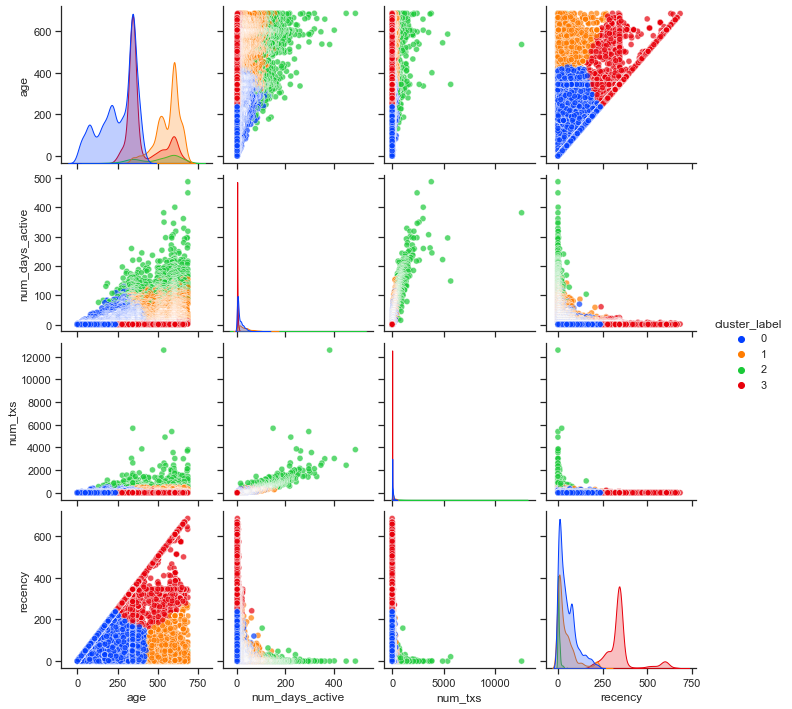

In [8]:
# Select the columns and cluster labels
columns = ["age", "num_days_active", "num_txs", "recency"]
data[
    "cluster_label"
] = cluster_labels  # Use the cluster labels obtained from clustering

# Define a custom color palette
palette = sns.color_palette("bright", len(data["cluster_label"].unique()))

# Create pairplot
sns.set(style="ticks")
sns.pairplot(data, hue="cluster_label", palette=palette, plot_kws={"alpha": 0.7})

plt.show()

In [9]:
# Select the columns and cluster labels
columns = ["age", "recency"]

# Create box plot for age
fig_age = px.box(data, x="cluster_label", y="age", title="Box Plot: Age")
fig_age.update_xaxes(title="Cluster Label")
fig_age.update_yaxes(title="Age")

# Create box plot for recency
fig_recency = px.box(data, x="cluster_label", y="recency", title="Box Plot: Recency")
fig_recency.update_xaxes(title="Cluster Label")
fig_recency.update_yaxes(title="Recency")

# Show the plots
fig_age.show()
fig_recency.show()

## Individual Platforms

In [17]:
PLATFORM_NAME = "Zora"

In [18]:
df_filtered = df[df["name"].str.contains(PLATFORM_NAME)]
df_filtered.describe()

,age,num_days_active,num_txs,recency,cluster_label
count,7003.000000,7003.000000,7003.000000,7003.000000,7003.000000
mean,392.130658,30.309010,135.660431,78.536484,0.796087
std,164.203924,37.774575,279.714022,129.204971,1.023211
min,0.000000,1.000000,1.000000,0.000000,0.000000
25%,279.000000,6.000000,15.000000,9.000000,0.000000
50%,363.000000,17.000000,62.000000,24.000000,0.000000
75%,549.000000,39.000000,143.000000,74.000000,1.000000
max,687.000000,382.000000,12585.000000,667.000000,3.000000


In [19]:
columns = ["age", "num_days_active", "num_txs", "recency"]
bin_counts = {"age": 20, "num_days_active": 30, "num_txs": 100, "recency": 20}

for column in columns:
    fig = go.Figure()

    # Create histogram trace for the current column
    histogram = go.Histogram(
        x=df_filtered[column],
        nbinsx=bin_counts[column],
        histnorm="probability",
        name=f'{column.replace("_", " ").title()} Distribution',
        marker=dict(color="steelblue"),
        opacity=0.8,
    )

    fig.add_trace(histogram)

    # Set layout
    fig.update_layout(
        title=f'{column.replace("_", " ").title()} Distribution on Optimism',
        xaxis_title=f'{column.replace("_", " ").title()}',
        yaxis_title="Percentage",
        yaxis_tickformat=".0%",
        bargap=0.05,
        bargroupgap=0.2,
    )

    fig.show()

In [23]:
# Select the columns for clustering
columns = ["age", "num_days_active", "num_txs", "recency"]
data = df_filtered[columns].dropna()

# Perform k-means clustering
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data)

# Get the cluster labels for each address
cluster_labels = kmeans.labels_

# Update the DataFrame with cluster labels (only for non-null values)
df.loc[data.index, "cluster_label"] = cluster_labels

# Print the counts of addresses in each cluster
cluster_counts = df["cluster_label"].value_counts()
print("Cluster Counts:")
print(cluster_counts)

Cluster Counts:
0.0    7366
3.0    5148
1.0    2193
2.0     205
Name: cluster_label, dtype: int64


In [24]:
# Create a scatter plot of the clusters
fig = px.scatter(
    df_filtered,
    x="age",
    y="recency",
    color="cluster_label",
    hover_data=["num_days_active", "num_txs"],
    title="K-Means Clustering",
)

fig.show()

In [26]:
# Select the columns and cluster labels
columns = ["age", "recency"]

data[
    "cluster_label"
] = cluster_labels  # Use the cluster labels obtained from clustering

# Create box plot for age
fig_age = px.box(data, x="cluster_label", y="age", title="Box Plot: Age")
fig_age.update_xaxes(title="Cluster Label")
fig_age.update_yaxes(title="Age")

# Create box plot for recency
fig_recency = px.box(data, x="cluster_label", y="recency", title="Box Plot: Recency")
fig_recency.update_xaxes(title="Cluster Label")
fig_recency.update_yaxes(title="Recency")

# Show the plots
fig_age.show()
fig_recency.show()